In [1]:
import cv2, numpy as np
import math
import time
import random
from matplotlib import pyplot as plt
%matplotlib inline
from bokeh.plotting import figure
from bokeh.io import output_notebook, show, push_notebook


output_notebook()


def imshow(tit, image) :
    plt.title(tit)    
    if len(image.shape) == 3 :
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    else :
        plt.imshow(image, cmap="gray")
    plt.show()
    
    
def create_win(frames, scale=1.0) :    
    global myImage
    
    all = []
    for f in frames :
        if len(f.shape ) !=  3 : f = cv2.cvtColor(f, cv2.COLOR_GRAY2BGR)
        all.append(f)
    frame = np.vstack(all)
    
    fr=cv2.cvtColor(frame, cv2.COLOR_BGR2RGBA) # because Bokeh expects a RGBA image
    fr=cv2.flip(fr, -1) # because Bokeh flips vertically
    width=fr.shape[1]
    height=fr.shape[0]    

    p = figure(x_range=(0,width), y_range=(0,height), output_backend="webgl", width=int(width*scale), height=int(height*scale))    
    myImage = p.image_rgba(image=[fr], x=0, y=0, dw=width, dh=height)
    show(p, notebook_handle=True)   
    
    
def update_win(frames) :
    
    all = []
    for f in frames :
        if len(f.shape ) !=  3 : f = cv2.cvtColor(f, cv2.COLOR_GRAY2BGR)
        all.append(f)
    frame = np.vstack(all)
    
    fr=cv2.cvtColor(frame, cv2.COLOR_BGR2RGBA)
    fr=cv2.flip(fr, 0)
    myImage.data_source.data['image']=[fr]
    push_notebook()


Loading BokehJS ...

In [16]:
face_classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
eye_classifier = cv2.CascadeClassifier('haarcascade_eye.xml')

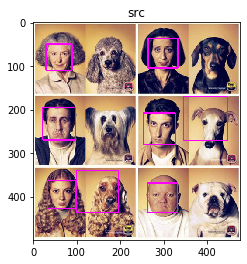

In [22]:
src = cv2.imread('dog.jpg')
faces = face_classifier.detectMultiScale(src)

for (x, y, w, h) in faces:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)    

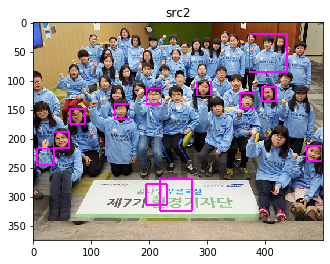

In [23]:
src2 = cv2.imread('group.jpg')
faces = face_classifier.detectMultiScale(src2)

for (x, y, w, h) in faces:
    cv2.rectangle(src2, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src2', src2)

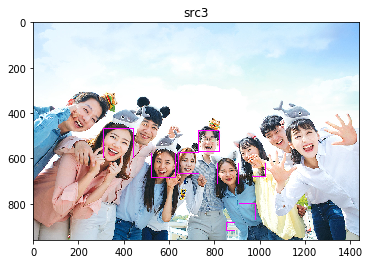

In [24]:
src3 = cv2.imread('group2.jpg')
faces = face_classifier.detectMultiScale(src3)

for (x, y, w, h) in faces:
    cv2.rectangle(src3, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src3', src3)    

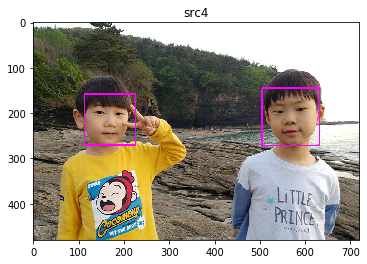

In [25]:
src4 = cv2.imread('kids.png')
faces = face_classifier.detectMultiScale(src4)

for (x, y, w, h) in faces:
    cv2.rectangle(src4, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src4', src4)    

위와 같은 방식은 눈은 잡히지 않음

그래서 눈을 식별하는 classifier를 다음과 같이 추가해줌

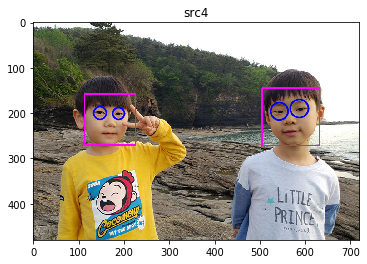

In [33]:
src4 = cv2.imread('kids.png')

faces = face_classifier.detectMultiScale(src4)

for (x1, y1, w1, h1) in faces:
        cv2.rectangle(src4, (x1, y1), (x1 + w1, y1 + h1), (255, 0, 255), 2)
        
        # 각 얼굴 안에서 눈을 잡기 위해서 아래와 같이 코드를 작성
        faceROI = src4[y1:y1 + int((2*h1)/3), x1:x1 + w1] # 행렬로 접근하기 때문에 y좌표를 먼저쓴다
        eyes = eye_classifier.detectMultiScale(faceROI)

        for (x2, y2, w2, h2) in eyes:
            center = (int(x2 + w2 / 2), int(y2 + h2 / 2))
            cv2.circle(faceROI, center, int(w2 / 2), (255, 0, 0), 2, cv2.LINE_AA)

imshow('src4', src4)  

---

### Histogram of Oriented Gradients(HOG)
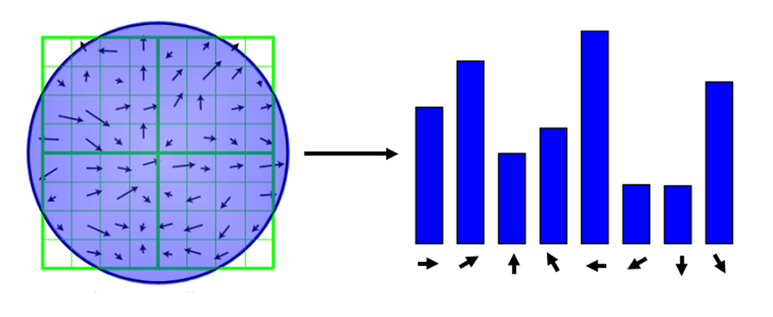

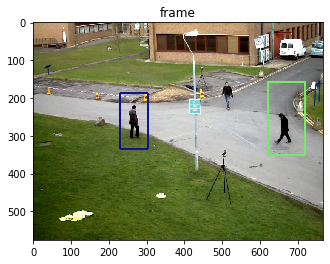

In [4]:
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

frame = cv2.imread("people.jpg")
detected, _ = hog.detectMultiScale(frame)

for (x, y, w, h) in detected :
    c = (random.randint(0,255), random.randint(0,255), random.randint(0,255))
    cv2.rectangle(frame, (x,y), (x+w,y+h), c, 3)
    
imshow('frame', frame)

In [37]:
#### 동영상 처음 시작할 때
cap = cv2.VideoCapture("vtest.avi")

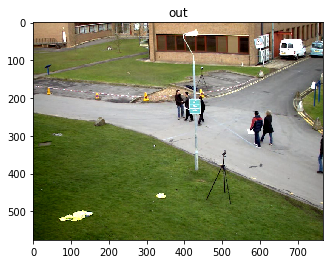

In [39]:
for i in range(20): # 20번째 프레임
    ret, frame = cap.read()  # 첫번째 리턴값--> 프레임이 존재하는지 존재하지 않는지를 의미함

imshow("out",frame)

for i in range(20): # 40번째 프레임(누적)
    ret, frame = cap.read()  

imshow("out",frame)

In [48]:
create_win([frame], scale=0.7)

In [49]:
for i in range(100): # 40번째 프레임에서 140번째 프레임까지 계속해서 업뎃 되는거
    ret, frame = cap.read()  # 첫번째 리턴값--> 존재하는지 존재하지 않는지(뭐가?)
    update_win([frame]) # 매 프레임마다 업뎃해줌

### 위의 create_win([frame], scale=0.7)이 없다고 가정하고 처음부터 하려면?

In [2]:
#### 동영상 처음 시작할 때
cap = cv2.VideoCapture("vtest.avi")

In [5]:
for i in range(300):
    ret, frame = cap.read()
    
    if i == 0:
        create_win([frame], scale=0.7)
        
    if not ret:
        break

    detected, _ = hog.detectMultiScale(frame)
    
    for (x, y, w, h) in detected :
        c = (random.randint(0,255), random.randint(0,255), random.randint(0,255))
        cv2.rectangle(frame, (x,y), (x+w,y+h), c, 3)
    
    update_win([frame])

In [60]:
#### 동영상 처음 시작할 때
cap = cv2.VideoCapture("foodfighter.mp4")

In [68]:
for i in range(300):
    ret, frame = cap.read()
    
    if i == 0:
        create_win([frame], scale=0.7)
        
    if not ret:
        break

    detected, _ = hog.detectMultiScale(frame)
    
    for (x, y, w, h) in detected :
        c = (random.randint(0,255), random.randint(0,255), random.randint(0,255))
        cv2.rectangle(frame, (x,y), (x+w,y+h), c, 3)
    
    update_win([frame])